<a href="https://colab.research.google.com/github/arakaki-tokyo/share/blob/main/210919_douro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [32]:
!pip install geopandas
!pip install --upgrade plotly

In [1]:
import pandas as pd
import geopandas as gpd
import os
import urllib.request as rq
import plotly.express as px
import matplotlib.pyplot as plt

使用するデータ

[国土数値情報 \| 道路データ](https://nlftp.mlit.go.jp/ksj/gmlold/datalist/gmlold_KsjTmplt-N01.html)

東京：https://nlftp.mlit.go.jp/ksj/gmlold/data/N01/N01-07L/N01-07L-13-01.0a_GML.zip

## データ取得

In [2]:
def get_data():
    url = "https://nlftp.mlit.go.jp/ksj/gmlold/data/N01/N01-07L/N01-07L-13-01.0a_GML.zip"
    path = "douro_13.zip"
    
    if not os.path.exists(path):
        with open(path, "wb") as f:
            f.write(rq.urlopen(url).read())
    
    df = gpd.read_file(path)
    
    return df

In [3]:
df = get_data()
df

,N01_001,N01_002,N01_003,N01_004,geometry
0,3,東京所沢線,None,None,"LINESTRING (139.49678 35.79931, 139.49428 35.7..."
1,3,東京所沢線,None,None,"LINESTRING (139.49206 35.79847, 139.49011 35.7..."
2,3,東京所沢線,None,None,"LINESTRING (139.49011 35.79847, 139.48761 35.7..."
3,3,東京所沢線,None,None,"LINESTRING (139.48761 35.79792, 139.47872 35.7..."
4,3,東京所沢線,None,None,"LINESTRING (139.46956 35.79431, 139.46789 35.7..."
...,...,...,...,...,...
5288,1,首都高速,神奈川１号横羽線,None,"LINESTRING (139.70956 35.50853, 139.71094 35.5..."
5289,1,首都高速,神奈川１号横羽線,None,"LINESTRING (139.71094 35.50908, 139.71289 35.5..."
5290,1,首都高速,神奈川１号横羽線,None,"LINESTRING (139.71289 35.51047, 139.71372 35.5..."
5291,1,首都高速,神奈川１号横羽線,None,"LINESTRING (139.71511 35.51186, 139.72064 35.5..."


## 路線名としてname列にまとめる

In [11]:
df["N01_004"] = "(" + df["N01_004"] + ")"
df.fillna("", inplace=True)
df["name"] = df["N01_002"] + df["N01_003"] + df["N01_004"]
df = df.filter(items=["name", "geometry"])
df

,name,geometry
0,東京所沢線,"LINESTRING (139.49678 35.79931, 139.49428 35.7..."
1,東京所沢線,"LINESTRING (139.49206 35.79847, 139.49011 35.7..."
2,東京所沢線,"LINESTRING (139.49011 35.79847, 139.48761 35.7..."
3,東京所沢線,"LINESTRING (139.48761 35.79792, 139.47872 35.7..."
4,東京所沢線,"LINESTRING (139.46956 35.79431, 139.46789 35.7..."
...,...,...
5288,首都高速神奈川１号横羽線,"LINESTRING (139.70956 35.50853, 139.71094 35.5..."
5289,首都高速神奈川１号横羽線,"LINESTRING (139.71094 35.50908, 139.71289 35.5..."
5290,首都高速神奈川１号横羽線,"LINESTRING (139.71289 35.51047, 139.71372 35.5..."
5291,首都高速神奈川１号横羽線,"LINESTRING (139.71511 35.51186, 139.72064 35.5..."


## 元データの構造がツラい

例として東京都の道路データを取得し、`name`列だけ少し整形したDataFrameがこちらです。

In [12]:
df

,name,geometry
0,東京所沢線,"LINESTRING (139.49678 35.79931, 139.49428 35.7..."
1,東京所沢線,"LINESTRING (139.49206 35.79847, 139.49011 35.7..."
2,東京所沢線,"LINESTRING (139.49011 35.79847, 139.48761 35.7..."
3,東京所沢線,"LINESTRING (139.48761 35.79792, 139.47872 35.7..."
4,東京所沢線,"LINESTRING (139.46956 35.79431, 139.46789 35.7..."
...,...,...
5288,首都高速神奈川１号横羽線,"LINESTRING (139.70956 35.50853, 139.71094 35.5..."
5289,首都高速神奈川１号横羽線,"LINESTRING (139.71094 35.50908, 139.71289 35.5..."
5290,首都高速神奈川１号横羽線,"LINESTRING (139.71289 35.51047, 139.71372 35.5..."
5291,首都高速神奈川１号横羽線,"LINESTRING (139.71511 35.51186, 139.72064 35.5..."


`geometry`を細かく見てみると、全て[LineStrings](https://shapely.readthedocs.io/en/stable/manual.html#linestrings)オブジェクトで多くが2~4個のポイントで構成されていることが分かります。

In [13]:
df.geometry.type.unique()

array(['LineString'], dtype=object)

In [14]:
px.histogram([len(tuple(g.coords)) for g in df.geometry])

これが最初のツラいところで、諸々の処理をする際には路線毎に1行で表現してほしいわけですよ。  
これはgeopandasの[dissolve](https://geopandas.org/docs/user_guide/aggregation_with_dissolve.html)メソッドで解決できるのですが、結局細切れのLineStringを力技で一つのMultiLineStringにしただけなので、どうにもスッキリしない違和感が残ります。  
具体的な弊害としては、いざデータをgeojsonに出力するときにファイルサイズが無駄に大きくなってしまいます。

In [15]:
# 路線毎にまとめることはできるが…
df.dissolve(by="name")

,geometry
name,
三郷松伏線,"MULTILINESTRING ((139.88397 35.83625, 139.8828..."
上野原丹波山線,"MULTILINESTRING ((138.95267 35.75319, 138.9535..."
上野原五日市線,"MULTILINESTRING ((139.12181 35.70458, 139.1198..."
上野尾竹橋線,"MULTILINESTRING ((139.77814 35.72294, 139.7795..."
世田谷町田線,"MULTILINESTRING ((139.44956 35.54100, 139.4470..."
...,...
首都高速６号三郷線,"MULTILINESTRING ((139.82036 35.75544, 139.8209..."
首都高速６号向島線,"MULTILINESTRING ((139.77842 35.68350, 139.7795..."
首都高速７号小松川線,"MULTILINESTRING ((139.78925 35.69072, 139.7911..."


## plotlyで描画するのがツラい

ここまではデータをデータとして見てきましたが、地理データであるからには視覚的に情報を確認したいところです。  
ざっと全体を見るだけなら、GeoDataFrameの`plot`メソッドでもいいでしょう。

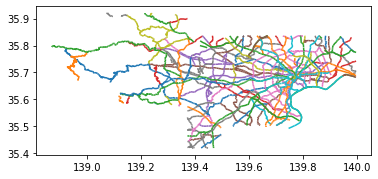

In [67]:
df.plot(column="name")

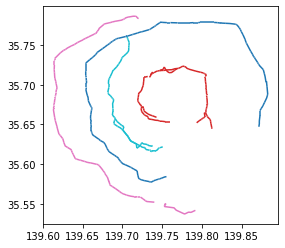

In [69]:
# 路線面が「環状～」を表示
df.query("name.str.startswith('環状')", engine="python").plot(column="name")

しかしながらより詳細に確認したい場合にはやはり物足りません。  
そこでplotlyを使いたいわけですが、なんと**plotlyでLineStringを描画する場合には`geojson`や`GeoDataFrame`をそのまま読み込むことができません。**😡  
ではどうするかというと、行毎にポイントを表すDataFrameを作る必要があるのです。

[公式のサンプル](https://plotly.com/python/lines-on-mapbox/#lines-on-mapbox-maps-from-geopandas)から該当の処理を持ってくると以下のようになります。

In [26]:
import shapely
import numpy as np

def df_for_plotly(geo_df):
    lats = []
    lons = []
    names = []

    for feature, name in zip(geo_df.geometry, geo_df.name):
        if isinstance(feature, shapely.geometry.linestring.LineString):
            linestrings = [feature]
        elif isinstance(feature, shapely.geometry.multilinestring.MultiLineString):
            linestrings = feature.geoms
        else:
            continue
        for linestring in linestrings:
            x, y = linestring.xy
            lats = np.append(lats, y)
            lons = np.append(lons, x)
            names = np.append(names, [name]*len(y))
            lats = np.append(lats, None)
            lons = np.append(lons, None)
            names = np.append(names, None)
    
    return pd.DataFrame({"lat": lats, "lon": lons, "name": names})

In [27]:
foo = df_for_plotly(df)
foo

,lat,lon,name
0,35.7993,139.497,東京所沢線
1,35.7987,139.494,東京所沢線
2,35.7985,139.492,東京所沢線
3,None,None,None
4,35.7985,139.492,東京所沢線
...,...,...,...
20709,35.5138,139.721,首都高速神奈川１号横羽線
20710,35.5146,139.722,首都高速神奈川１号横羽線
20711,35.5185,139.725,首都高速神奈川１号横羽線
20712,35.5221,139.731,首都高速神奈川１号横羽線


In [30]:
fig = px.line_mapbox(foo, 
                     lat="lat", 
                     lon="lon", 
                     hover_name="name",
                     mapbox_style="stamen-terrain", 
                     zoom=9)
fig.show()

一つのLineStringを展開する毎に`None`を追加しているのLineString同士が繋がってしまうのを防ぐためです。  
既に確認したように、元データは細切れのLineStringで一つの路線を表していますが、その順番や向きはなにも保障されていません。  
plotlyでは指定された`lat`, `lon`のポイントを順番に繋いで描画するため、区切りとしての`None`が必要なのです。


### 路線毎に色分けしたい

描画のためにわざわざDFを変換しないといけない時点でツラいのですが、その描画されたものもマウスホバーしないとどの路線なのか分かりません。  
路線ごとに色分けする方法として、先の`df_for_plotly`関数に手を加えて実現できないことはないのですが、JSの処理がめちゃくちゃ遅くなるので割愛します。  
根本的な解決策は後述しますが、ここでは簡単に[buffer](https://shapely.readthedocs.io/en/stable/manual.html#object.buffer)メソッドでLineStringをPolygon化する方法を紹介します。

In [44]:
foo = df.dissolve(by="name")
foo.reset_index(inplace=True)
foo.geometry = foo.buffer(0.001)
foo = foo.head(20)
foo

,name,geometry
0,三郷松伏線,"POLYGON ((139.88242 35.81739, 139.88242 35.818..."
1,上野原丹波山線,"POLYGON ((138.92101 35.78124, 138.92108 35.781..."
2,上野原五日市線,"POLYGON ((139.08525 35.66372, 139.08516 35.663..."
3,上野尾竹橋線,"POLYGON ((139.77547 35.73684, 139.77547 35.736..."
4,世田谷町田線,"POLYGON ((139.44578 35.54602, 139.44578 35.546..."
5,中央自動車道富士吉田線(中央),"POLYGON ((139.12200 35.62085, 139.12190 35.620..."
6,丸子中山茅ヶ崎線,"MULTIPOLYGON (((139.54071 35.50165, 139.54189 ..."
7,保谷志木線,"POLYGON ((139.54828 35.76035, 139.54828 35.760..."
8,八王子五日市線,"POLYGON ((139.22732 35.72932, 139.22636 35.729..."
9,八王子武蔵村山線,"POLYGON ((139.35638 35.66646, 139.35641 35.666..."


In [45]:
fig = px.choropleth_mapbox(foo,
                           geojson=foo.geometry,
                           locations=foo.index,
                           color="name",
                           center={"lat": 35.7, "lon": 139.7},
                           mapbox_style="carto-darkmatter",
                           zoom=10
                          )
fig.update_traces({'marker_line_width': 0,
                   'marker_opacity': 0.5
                  })
fig.show()

ポリゴン化してしまえばplotlyの`choropleth_mapbox`でデータをそのまま読み込んでもらえるという発想なのですが、そもそも`choropleth_mapbox`の用途に適さないので20レコードぐらいでも重くなってしまいます。  
実用には供さないけどこういうこともできる、ぐらいのTipsでした。

## 解決策 -- LineString をまとめる --

さて、じゃあ結局どうすりゃいいのという話ですが、そもそも一本の道路が細切れのLineStringになっているのが諸悪の根源な訳なので、元データを一路線につき一つのLineString(枝分かれ等の場合にのみMultiLineString)に変換すれば良いわけです。  
さらにそこからplotlyで描画用にシーケンシャルなポイントのDFを生成できれば良いわけです。

という訳でできあがった関数がこちらです。

In [47]:
import pandas as pd
import geopandas as gpd
from enum import Enum
from shapely.geometry import LineString, MultiLineString

def reduce_lines(gdf, to, name):
    '''
    parameters
        gdf: geopandas.GeoDataFrame
            geometry列がLineString型またはMultiLineString型
        to: str
            "pandas" or "geopandas"
        name: 戻り値のDataFrameのname列に使われる
        
    return 
     pandas.DataFrame　columns: ['name', 'group', 'lon', 'lat' ] or
     geopandas.GeoDataFrame columns: ['name', 'geometry']
    '''
    
    class Direction(Enum):
        FORWARD = 0
        BACKWARD = 1   
        
        
    def list_to_gdf(l):
        '''
        parameters
            l: list of tuple of lon/lat
        return
            geopandas.GeoDataFrame
            columns: ['geometry' ]
        '''
        
        gdf = gpd.GeoDataFrame({"geometry": [LineString(l)]})
        return gdf
        
    def list_to_df(l):
        '''
        parameters
            l: list of tuple of lon/lat
        return
            pandas.DataFrame
            columns: ['group', 'lon', 'lat' ]
        '''
        
        df = pd.DataFrame(l, columns=['lon', 'lat'])
        df['group'] = f'{name}_{group_count}'
        return df
    
    def line_to_tuple(iterable, list_of_tuple):
        for i in iterable:
            if isinstance(i, LineString):
                list_of_tuple.append(tuple(i.coords))
            elif isinstance(i, MultiLineString): 
                line_to_tuple(i, list_of_tuple)
            
    if to == "pandas":
        list_to = list_to_df
    elif to == "geopandas":
        list_to = list_to_gdf
    else:
        raise TypeError("'to' argument must be 'pandas' or 'geopandas'")
        return
    

    work = list()
    dfs = list()
    lines = list()
    line_to_tuple(gdf.geometry, lines)
    
    lines = list(set(lines))
    
    dir = Direction.BACKWARD
    group_count = 1
    
    
    while lines:
        if not work:
            work.extend(lines.pop(0))
            continue
        
        if dir == Direction.BACKWARD:
            for i, line in enumerate(lines):
                if work[-1] in line:
                    l = list(lines.pop(i))
                    if l[0] != work[-1]:
                         l.reverse()
                    work.extend(l[1:])
                    break
            else:
                dir = Direction.FORWARD
                continue
        else:
            for i, line in enumerate(lines):
                if work[0] in line:
                    l = list(lines.pop(i))
                    if l[-1] != work[0]:
                        l.reverse()
                    work[0:0] = l[:-1]
                    break
            else:
                dfs.append(list_to(work))
                group_count += 1
                work = list()
                dir = Direction.BACKWARD
    
    if work:
        dfs.append(list_to(work))
        
    all = pd.concat(dfs)
    
    if to == "geopandas":
        all = all.dissolve()
    else:
        all.reset_index(drop=True, inplace=True)
        
    all["name"] = name
    return all


def convert_all(gdf, to):
    all = list()
    for name in gdf.name.unique():
        all.append(reduce_lines(gdf.query(f'name.str.startswith("{name}")', engine='python'), to, name))

    all_df = pd.concat(all)
    all_df.reset_index(drop=True, inplace=True)
    return all_df

元データからLineStringをまとめたGeoDataFrameに変換してみます。

In [49]:
all = convert_all(df, "geopandas")
all

,geometry,name
0,"MULTILINESTRING ((139.47539 35.77681, 139.4762...",東京所沢線
1,"LINESTRING (139.46539 35.83625, 139.46483 35.8...",川越所沢線
2,"LINESTRING (139.37733 35.80431, 139.37956 35.8...",川越入間線
3,"MULTILINESTRING ((139.37178 35.90014, 139.3698...",川越日高線
4,"MULTILINESTRING ((139.41483 35.68656, 139.4184...",立川所沢線
...,...,...
150,"MULTILINESTRING ((139.75731 35.64739, 139.7578...",首都高速１１号台場線
151,"LINESTRING (139.76314 35.76489, 139.76314 35.7...",首都高速中央環状線
152,"LINESTRING (139.75508 35.83625, 139.75703 35.8...",首都高速川口線
153,"MULTILINESTRING ((139.94647 35.68656, 139.9439...",首都高速湾岸線


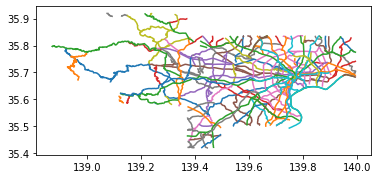

In [55]:
all.plot(column="name")

geojsonに変換した際のファイルサイズは約1/4になりました。

In [50]:
with open("df.geojson", "w") as f:
    f.write(df.to_json())

with open("all.geojson", "w") as f:
    f.write(all.to_json())

In [52]:
!du -h df.geojson all.geojson

1.2M	df.geojson
320K	all.geojson


さらにそこからplotly用のDFを生成してみます。

In [56]:
all_plotly = convert_all(all, "pandas")
all_plotly

,lon,lat,group,name
0,139.475389,35.776806,東京所沢線_1,東京所沢線
1,139.476222,35.775417,東京所沢線_1,東京所沢線
2,139.476778,35.773472,東京所沢線_1,東京所沢線
3,139.477611,35.771806,東京所沢線_1,東京所沢線
4,139.479278,35.772083,東京所沢線_1,東京所沢線
...,...,...,...,...
10451,139.740917,35.533528,首都高速神奈川１号横羽線_1,首都高速神奈川１号横羽線
10452,139.741194,35.537139,首都高速神奈川１号横羽線_1,首都高速神奈川１号横羽線
10453,139.741194,35.538528,首都高速神奈川１号横羽線_1,首都高速神奈川１号横羽線
10454,139.740917,35.540194,首都高速神奈川１号横羽線_1,首都高速神奈川１号横羽線


In [58]:
fig = px.line_mapbox(all_plotly, 
                     lat="lat", 
                     lon="lon",
                     color="name", 
                     line_group="group", 
                     hover_data={"group":False},
                     mapbox_style="carto-darkmatter", 
                     zoom=9)
fig.show()

それっぽく描画することができてますね。
これにて一件落着🎉🎊